Copyright (c) 2020 Ryan Cohn and Elizabeth Holm. All rights reserved. <br />
Licensed under the MIT License (see LICENSE for details) <br />
Written by Ryan Cohn

# Instance Segmentation of Powder Particles and Satellites

This example will take you through the process of training a model to segment powder particles and visualizing the model predictions.

In [2]:
## regular module imports
import cv2
import json
import matplotlib.pyplot as plt
import numpy as np
import os
from pathlib import Path
import pickle
import skimage.io
import sys

## detectron2
from detectron2 import model_zoo
from detectron2.config import get_cfg
from detectron2.data import (
    DatasetCatalog,
    MetadataCatalog,
)
from detectron2.engine import DefaultTrainer, DefaultPredictor
from detectron2.structures import BoxMode

root = '../../../'
ocean_images = root + '../../../../ocean/projects/dmr200021p/sprice/initial_paper_complete_set/'
ocean_syn = root + '../../../../ocean/projects/dmr200021p/sprice/synthetic_training/'
sys.path.append(root)

from ampis import data_utils, visualize, export_anno

%matplotlib inline

# Labeling Data

The [VGG Image Annotator](http://www.robots.ox.ac.uk/~vgg/software/via/) was used to generate particle labels. The a

# Loading Data
The process for training models for powder particles and satellites is identical. Enter the corresponding value depending on which model you want to train. <br />
The paths to individual images, and all annotation data are stored in the JSON files generated by the VGG image annotator.



In [3]:
EXPERIMENT_NAME = 'satellite' # can be 'particle' or 'satellite'
json_path_train = Path(ocean_syn,'trainings','synthetic_training_satellite_AMPIS1.2.json')  # path to training data
json_path_val = Path(ocean_syn,'trainings', 'synthetic_validation_satellite_AMPIS1.0.json')  # path to training data
assert json_path_train.is_file(), 'training file not found!'
assert json_path_val.is_file(), 'validation file not found!'


## Registration
Detectron2 requires that datasets be registered for later use.
Registration stores the name of the dataset and a function that can be used to retrieve the image paths and labels in a format that the model can use.

In [4]:
DatasetCatalog.clear()  # resets catalog, helps prevent errors from running cells multiple times

# store names of datasets that will be registered for easier access later
dataset_train = f'{EXPERIMENT_NAME}_Train'
dataset_valid = f'{EXPERIMENT_NAME}_Val'

# register the training dataset
DatasetCatalog.register(dataset_train, lambda f = json_path_train: data_utils.get_ddicts(label_fmt='via2',  # annotations generated from vgg image annotator
                                                                                                     im_root=f,  # path to the training data json file
                                                                                                     dataset_class='Train'))  # indicates this is training data
# register the validation dataset
DatasetCatalog.register(dataset_valid, lambda f = json_path_val: data_utils.get_ddicts(label_fmt='via2',  # annotations generated from vgg image annotator
                                                                                                im_root=f,  # path to validation data json file
                                                                                                dataset_class='Validation'))  # indicates this is validation data
                              
print(f'Registered Datasets: {DatasetCatalog.list()}')

## There is also a metadata catalog, which stores the class names.
for d in [dataset_train, dataset_valid]:
    MetadataCatalog.get(d).set(**{'thing_classes': [EXPERIMENT_NAME]})

Registered Datasets: ['satellite_Train', 'satellite_Val']


## Verify images and annotations are loaded correctly
Also, this is a great time to admire my hand-drawn labels, which took sooooo long to do!
### Training Data

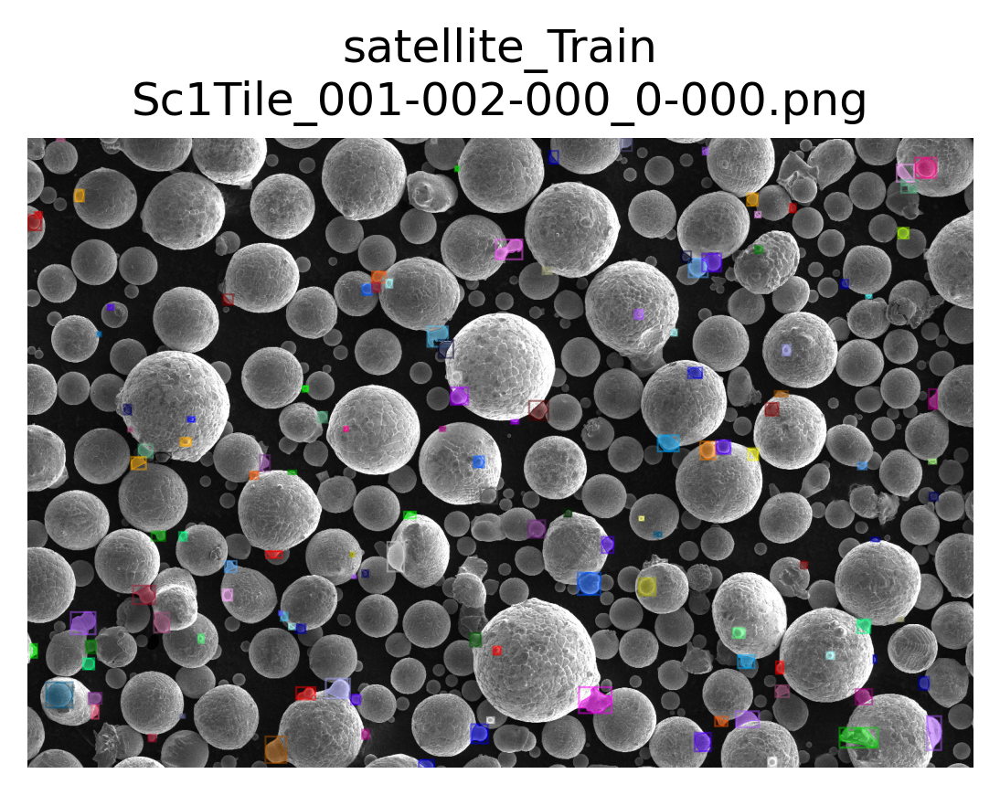

ddict info:
	path: ../../../../../../../ocean/projects/dmr200021p/sprice/synthetic_training/trainings/../images/AMPIS_dataset/renders/Sc1Tile_001-002-000_0-000.png
	num_instances: 133


In [5]:
#for i in np.random.choice(DatasetCatalog.get(dataset_train), 3, replace=False):
    #visualize.display_ddicts(i, None, dataset_train, suppress_labels=True)
for i in DatasetCatalog.get(dataset_train):
    visualize.display_ddicts(i, None, dataset_train, suppress_labels=True)

### Validation Data

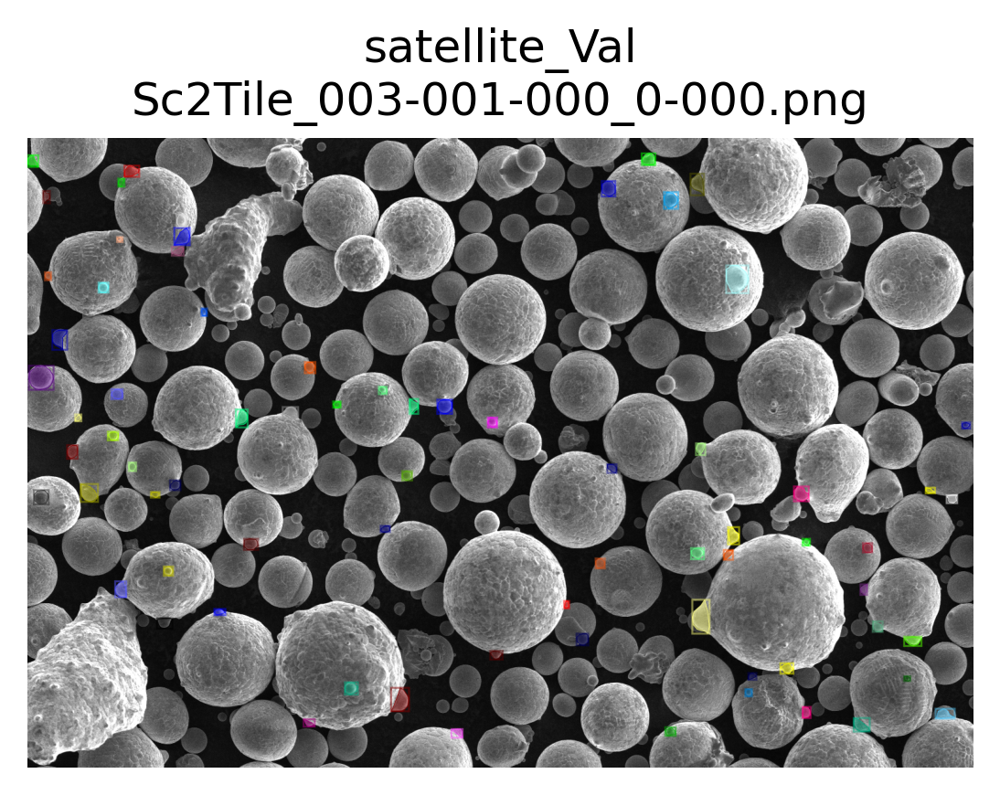

ddict info:
	path: ../../../../../../../ocean/projects/dmr200021p/sprice/synthetic_training/trainings/../images/AMPIS_dataset/renders/Sc2Tile_003-001-000_0-000.png
	num_instances: 74


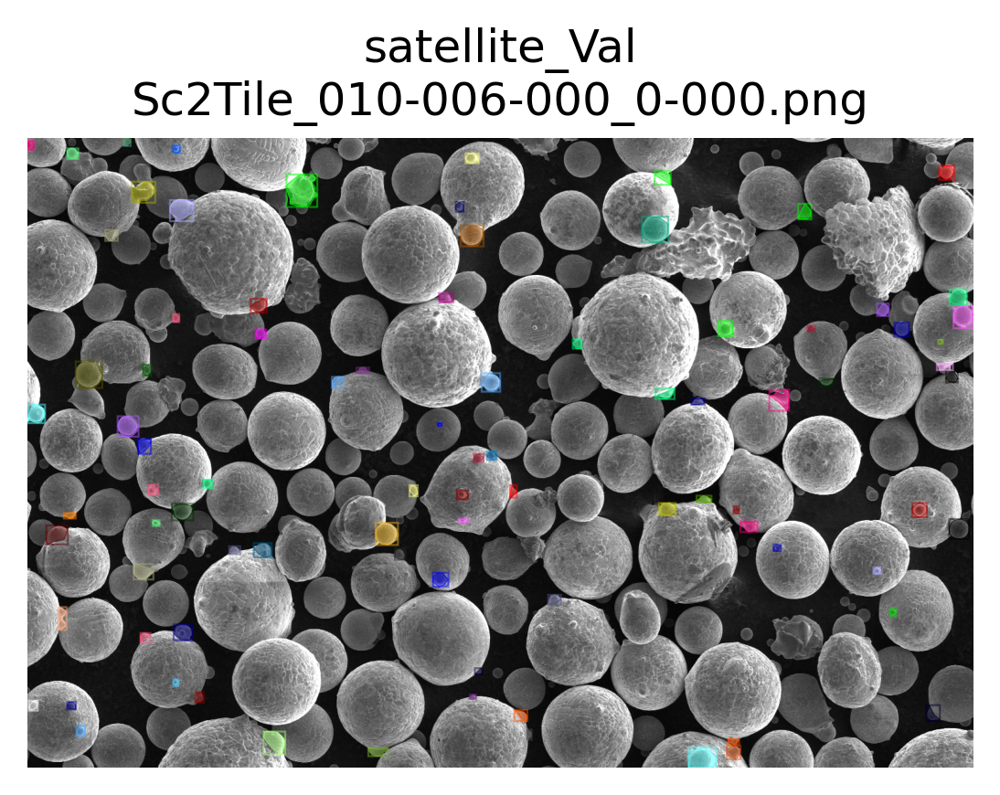

ddict info:
	path: ../../../../../../../ocean/projects/dmr200021p/sprice/synthetic_training/trainings/../images/AMPIS_dataset/renders/Sc2Tile_010-006-000_0-000.png
	num_instances: 88


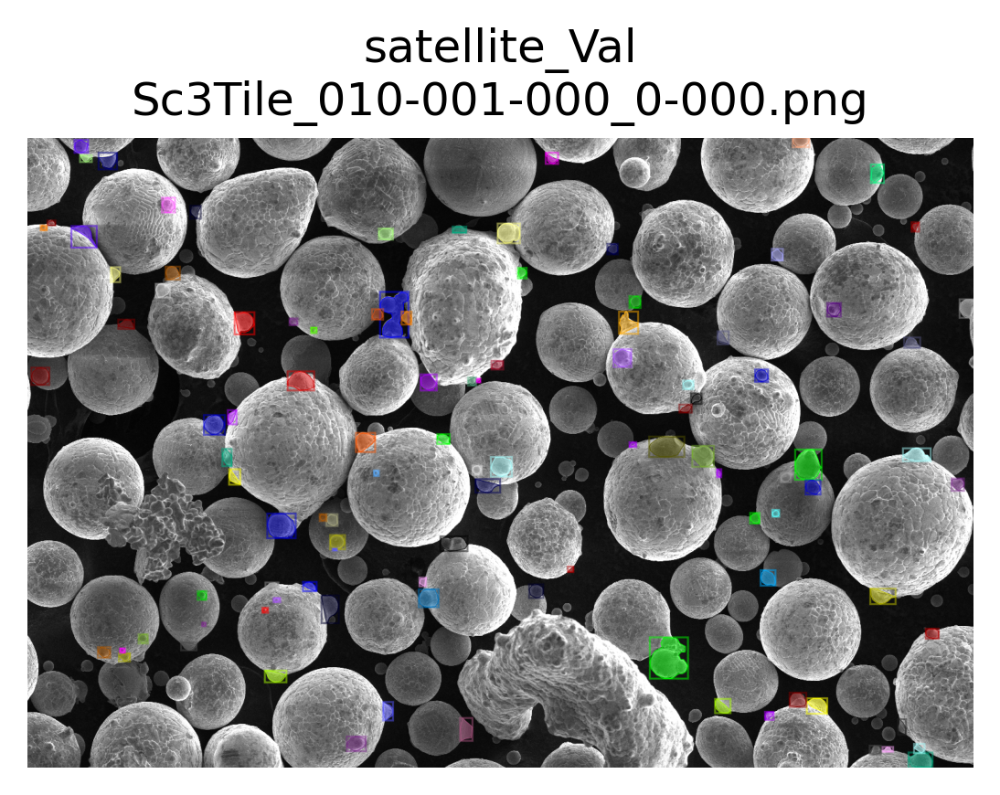

ddict info:
	path: ../../../../../../../ocean/projects/dmr200021p/sprice/synthetic_training/trainings/../images/AMPIS_dataset/renders/Sc3Tile_010-001-000_0-000.png
	num_instances: 105


In [6]:
for i in DatasetCatalog.get(dataset_valid):
    visualize.display_ddicts(i, None, dataset_valid, suppress_labels=True)

## Model Configuration
This is where we specify the directory where the outputs are saved, various hyperparameters for the model, and more.

In [5]:
cfg = get_cfg() # initialize cfg object
cfg.merge_from_file(model_zoo.get_config_file('COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml'))  # load default parameters for Mask R-CNN
cfg.INPUT.MASK_FORMAT = 'polygon'  # masks generated in VGG image annotator are polygons
cfg.DATASETS.TRAIN = (dataset_train,)  # dataset used for training model
cfg.DATASETS.TEST = (dataset_train, dataset_valid)  # we will look at the predictions on both sets after training
cfg.SOLVER.IMS_PER_BATCH = 1 # number of images per batch (across all machines)
cfg.SOLVER.CHECKPOINT_PERIOD = 1000  # number of iterations after which to save model checkpoints
cfg.MODEL.DEVICE='cuda'  # 'cpu' to force model to run on cpu, 'cuda' if you have a compatible gpu
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1 # Since we are training separate models for particles and satellites there is only one class output
cfg.TEST.DETECTIONS_PER_IMAGE = 400 if EXPERIMENT_NAME == 'particle' else 250  # maximum number of instances that can be detected in an image (this is fixed in mask r-cnn)
cfg.SOLVER.MAX_ITER = 15000  # maximum number of iterations to run during training
                            # Increasing this may improve the training results, but will take longer to run (especially without a gpu!)

# model weights will be downloaded if they are not present
weights_path = Path('..','..','models','model_final_f10217.pkl')
if weights_path.is_file():
    print('Using locally stored weights: {}'.format(weights_path))
else:
    weights_path = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")
    print('Weights not found, weights will be downloaded from source: {}'.format(weights_path))
cfg.MODEL.WEIGHTs = str(weights_path)
cfg.OUTPUT_DIR = str(Path(ocean_syn,'Models', 'Synthetic_training_AMPIS1.2'))
# make the output directory
os.makedirs(Path(cfg.OUTPUT_DIR), exist_ok=True)

Weights not found, weights will be downloaded from source: https://dl.fbaipublicfiles.com/detectron2/COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x/137849600/model_final_f10217.pkl


# Model Training
Once we have everything set up, training is very easy!

Note- this block will generate a huge wall of text.

In [ ]:
trainer = DefaultTrainer(cfg)  # create trainer object from cfg
trainer.resume_or_load(resume=False)  # start training from iteration 0
trainer.train()  # train the model!

[07/29 04:41:05 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

[07/29 04:41:05 d2.data.build]: Removed 0 images with no usable annotations. 3 images left.
[07/29 04:41:05 d2.data.build]: Distribution of instances among all 1 categories:
|  category  | #instances   |
|:----------:|:-------------|
| satellite  | 298          |
|            |              |
[07/29 04:41:05 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in training: [ResizeShortestEdge(short_edge_length=(640, 672, 704, 736, 768, 800), max_size=1333, sample_style='choice'), RandomFlip()]
[07/29 04:41:05 d2.data.build]: Using training sampler TrainingSampler
[07/29 04:41:05 d2.data.common]: Serializing 3 elements to byte tensors and concatenating them all ...
[07/29 04:41:05 d2.data.common]: Serialized dataset takes 0.07 MiB
WARNING [07/29 04:41:05 d2.solver.build]: SOLVER.STEPS contains values larger than SOLVER.MAX_ITER. These values will be ignored.


/jet/home/sprice/.local/lib/python3.8/site-packages/torch/utils/data/dataloader.py:474: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 1, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


[07/29 04:41:05 d2.checkpoint.c2_model_loading]: Renaming Caffe2 weights ......
[07/29 04:41:05 d2.checkpoint.c2_model_loading]: Following weights matched with submodule backbone.bottom_up:
| Names in Model    | Names in Checkpoint      | Shapes                                          |
|:------------------|:-------------------------|:------------------------------------------------|
| res2.0.conv1.*    | res2_0_branch2a_{bn_*,w} | (64,) (64,) (64,) (64,) (64,64,1,1)             |
| res2.0.conv2.*    | res2_0_branch2b_{bn_*,w} | (64,) (64,) (64,) (64,) (64,64,3,3)             |
| res2.0.conv3.*    | res2_0_branch2c_{bn_*,w} | (256,) (256,) (256,) (256,) (256,64,1,1)        |
| res2.0.shortcut.* | res2_0_branch1_{bn_*,w}  | (256,) (256,) (256,) (256,) (256,64,1,1)        |
| res2.1.conv1.*    | res2_1_branch2a_{bn_*,w} | (64,) (64,) (64,) (64,) (64,256,1,1)            |
| res2.1.conv2.*    | res2_1_branch2b_{bn_*,w} | (64,) (64,) (64,) (64,) (64,64,3,3)             |
| res2.1.conv3.*  

[07/29 04:41:54 d2.utils.events]:  eta: 0:45:39  iter: 219  total_loss: 1.786  loss_cls: 0.2258  loss_box_reg: 0.4814  loss_mask: 0.4212  loss_rpn_cls: 0.3068  loss_rpn_loc: 0.3692  time: 0.1841  data_time: 0.0192  lr: 0.0043956  max_mem: 2007M
[07/29 04:41:59 d2.utils.events]:  eta: 0:45:36  iter: 239  total_loss: 1.613  loss_cls: 0.2041  loss_box_reg: 0.4313  loss_mask: 0.367  loss_rpn_cls: 0.2446  loss_rpn_loc: 0.3586  time: 0.1844  data_time: 0.0189  lr: 0.0047952  max_mem: 2007M
[07/29 04:42:03 d2.utils.events]:  eta: 0:45:34  iter: 259  total_loss: 1.589  loss_cls: 0.2045  loss_box_reg: 0.4321  loss_mask: 0.3512  loss_rpn_cls: 0.2703  loss_rpn_loc: 0.363  time: 0.1847  data_time: 0.0203  lr: 0.0051948  max_mem: 2007M
[07/29 04:42:07 d2.utils.events]:  eta: 0:45:29  iter: 279  total_loss: 1.518  loss_cls: 0.1891  loss_box_reg: 0.4243  loss_mask: 0.3334  loss_rpn_cls: 0.2388  loss_rpn_loc: 0.3477  time: 0.1848  data_time: 0.0199  lr: 0.0055944  max_mem: 2007M
[07/29 04:44:10 d2.uti

[07/29 04:46:16 d2.utils.events]:  eta: 0:41:09  iter: 1439  total_loss: 0.883  loss_cls: 0.1207  loss_box_reg: 0.2766  loss_mask: 0.1551  loss_rpn_cls: 0.07216  loss_rpn_loc: 0.2472  time: 0.1830  data_time: 0.0174  lr: 0.02  max_mem: 2007M
[07/29 04:46:20 d2.utils.events]:  eta: 0:41:03  iter: 1459  total_loss: 0.8935  loss_cls: 0.1136  loss_box_reg: 0.2661  loss_mask: 0.1534  loss_rpn_cls: 0.07225  loss_rpn_loc: 0.2676  time: 0.1830  data_time: 0.0177  lr: 0.02  max_mem: 2007M
[07/29 04:46:25 d2.utils.events]:  eta: 0:40:56  iter: 1479  total_loss: 0.8626  loss_cls: 0.1146  loss_box_reg: 0.2586  loss_mask: 0.132  loss_rpn_cls: 0.08864  loss_rpn_loc: 0.2494  time: 0.1829  data_time: 0.0199  lr: 0.02  max_mem: 2007M
[07/29 04:46:29 d2.utils.events]:  eta: 0:40:53  iter: 1499  total_loss: 0.8834  loss_cls: 0.137  loss_box_reg: 0.2603  loss_mask: 0.1381  loss_rpn_cls: 0.0799  loss_rpn_loc: 0.2776  time: 0.1829  data_time: 0.0194  lr: 0.02  max_mem: 2007M
[07/29 04:46:33 d2.utils.events]

[07/29 04:48:40 d2.utils.events]:  eta: 0:39:13  iter: 2099  total_loss: 0.6815  loss_cls: 0.08819  loss_box_reg: 0.2284  loss_mask: 0.1113  loss_rpn_cls: 0.046  loss_rpn_loc: 0.2176  time: 0.1833  data_time: 0.0166  lr: 0.02  max_mem: 2007M
[07/29 04:48:44 d2.utils.events]:  eta: 0:39:12  iter: 2119  total_loss: 0.7631  loss_cls: 0.09584  loss_box_reg: 0.2347  loss_mask: 0.1175  loss_rpn_cls: 0.05903  loss_rpn_loc: 0.2225  time: 0.1832  data_time: 0.0188  lr: 0.02  max_mem: 2007M
[07/29 04:48:48 d2.utils.events]:  eta: 0:39:08  iter: 2139  total_loss: 0.6914  loss_cls: 0.08948  loss_box_reg: 0.2353  loss_mask: 0.1137  loss_rpn_cls: 0.03968  loss_rpn_loc: 0.2077  time: 0.1832  data_time: 0.0188  lr: 0.02  max_mem: 2007M
[07/29 04:48:53 d2.utils.events]:  eta: 0:39:04  iter: 2159  total_loss: 0.6667  loss_cls: 0.08084  loss_box_reg: 0.2147  loss_mask: 0.1133  loss_rpn_cls: 0.03739  loss_rpn_loc: 0.2081  time: 0.1832  data_time: 0.0192  lr: 0.02  max_mem: 2007M
[07/29 04:48:57 d2.utils.e

[07/29 04:51:01 d2.utils.events]:  eta: 0:37:47  iter: 2759  total_loss: 0.5977  loss_cls: 0.07815  loss_box_reg: 0.189  loss_mask: 0.09814  loss_rpn_cls: 0.0387  loss_rpn_loc: 0.1918  time: 0.1836  data_time: 0.0182  lr: 0.02  max_mem: 2007M
[07/29 04:51:05 d2.utils.events]:  eta: 0:37:44  iter: 2779  total_loss: 0.605  loss_cls: 0.07805  loss_box_reg: 0.1892  loss_mask: 0.09815  loss_rpn_cls: 0.04062  loss_rpn_loc: 0.1968  time: 0.1836  data_time: 0.0183  lr: 0.02  max_mem: 2007M
[07/29 04:51:10 d2.utils.events]:  eta: 0:37:41  iter: 2799  total_loss: 0.5897  loss_cls: 0.07943  loss_box_reg: 0.1862  loss_mask: 0.09541  loss_rpn_cls: 0.03931  loss_rpn_loc: 0.1836  time: 0.1837  data_time: 0.0180  lr: 0.02  max_mem: 2007M
[07/29 04:51:14 d2.utils.events]:  eta: 0:37:37  iter: 2819  total_loss: 0.6502  loss_cls: 0.08948  loss_box_reg: 0.2115  loss_mask: 0.1117  loss_rpn_cls: 0.03724  loss_rpn_loc: 0.198  time: 0.1837  data_time: 0.0167  lr: 0.02  max_mem: 2007M
[07/29 04:51:18 d2.utils.

[07/29 04:53:26 d2.utils.events]:  eta: 0:35:40  iter: 3419  total_loss: 0.5351  loss_cls: 0.06521  loss_box_reg: 0.1792  loss_mask: 0.08712  loss_rpn_cls: 0.02799  loss_rpn_loc: 0.1692  time: 0.1838  data_time: 0.0189  lr: 0.02  max_mem: 2007M
[07/29 04:53:30 d2.utils.events]:  eta: 0:35:34  iter: 3439  total_loss: 0.5415  loss_cls: 0.07823  loss_box_reg: 0.1821  loss_mask: 0.08761  loss_rpn_cls: 0.02928  loss_rpn_loc: 0.175  time: 0.1838  data_time: 0.0192  lr: 0.02  max_mem: 2007M
[07/29 04:53:35 d2.utils.events]:  eta: 0:35:29  iter: 3459  total_loss: 0.5269  loss_cls: 0.06758  loss_box_reg: 0.1723  loss_mask: 0.09066  loss_rpn_cls: 0.03594  loss_rpn_loc: 0.1673  time: 0.1838  data_time: 0.0189  lr: 0.02  max_mem: 2007M
[07/29 04:53:39 d2.utils.events]:  eta: 0:35:24  iter: 3479  total_loss: 0.5427  loss_cls: 0.07006  loss_box_reg: 0.1743  loss_mask: 0.08863  loss_rpn_cls: 0.02634  loss_rpn_loc: 0.1787  time: 0.1838  data_time: 0.0195  lr: 0.02  max_mem: 2007M
[07/29 04:53:43 d2.ut

[07/29 04:55:53 d2.utils.events]:  eta: 0:33:43  iter: 4079  total_loss: 0.5289  loss_cls: 0.06626  loss_box_reg: 0.1745  loss_mask: 0.08392  loss_rpn_cls: 0.02546  loss_rpn_loc: 0.1715  time: 0.1841  data_time: 0.0199  lr: 0.02  max_mem: 2007M
[07/29 04:55:57 d2.utils.events]:  eta: 0:33:37  iter: 4099  total_loss: 0.5017  loss_cls: 0.06622  loss_box_reg: 0.1531  loss_mask: 0.08177  loss_rpn_cls: 0.03075  loss_rpn_loc: 0.1735  time: 0.1840  data_time: 0.0188  lr: 0.02  max_mem: 2007M
[07/29 04:56:01 d2.utils.events]:  eta: 0:33:32  iter: 4119  total_loss: 0.4937  loss_cls: 0.06055  loss_box_reg: 0.1631  loss_mask: 0.08299  loss_rpn_cls: 0.0232  loss_rpn_loc: 0.158  time: 0.1840  data_time: 0.0198  lr: 0.02  max_mem: 2007M
[07/29 04:56:06 d2.utils.events]:  eta: 0:33:31  iter: 4139  total_loss: 0.5191  loss_cls: 0.07026  loss_box_reg: 0.172  loss_mask: 0.08387  loss_rpn_cls: 0.02206  loss_rpn_loc: 0.1684  time: 0.1840  data_time: 0.0188  lr: 0.02  max_mem: 2007M
[07/29 04:56:10 d2.util

[07/29 04:58:13 d2.utils.events]:  eta: 0:31:30  iter: 4739  total_loss: 0.5245  loss_cls: 0.06712  loss_box_reg: 0.1722  loss_mask: 0.08022  loss_rpn_cls: 0.03413  loss_rpn_loc: 0.1745  time: 0.1840  data_time: 0.0201  lr: 0.02  max_mem: 2007M
[07/29 04:58:17 d2.utils.events]:  eta: 0:31:26  iter: 4759  total_loss: 0.4862  loss_cls: 0.06124  loss_box_reg: 0.1525  loss_mask: 0.08006  loss_rpn_cls: 0.02401  loss_rpn_loc: 0.1592  time: 0.1840  data_time: 0.0185  lr: 0.02  max_mem: 2007M
[07/29 04:58:21 d2.utils.events]:  eta: 0:31:22  iter: 4779  total_loss: 0.4943  loss_cls: 0.06252  loss_box_reg: 0.1518  loss_mask: 0.07782  loss_rpn_cls: 0.03277  loss_rpn_loc: 0.1656  time: 0.1840  data_time: 0.0180  lr: 0.02  max_mem: 2007M
[07/29 04:58:26 d2.utils.events]:  eta: 0:31:18  iter: 4799  total_loss: 0.49  loss_cls: 0.06884  loss_box_reg: 0.1557  loss_mask: 0.08002  loss_rpn_cls: 0.03111  loss_rpn_loc: 0.1638  time: 0.1840  data_time: 0.0196  lr: 0.02  max_mem: 2007M
[07/29 04:58:30 d2.uti

[07/29 05:02:08 d2.utils.events]:  eta: 0:27:58  iter: 5839  total_loss: 0.4104  loss_cls: 0.04849  loss_box_reg: 0.1325  loss_mask: 0.06686  loss_rpn_cls: 0.02158  loss_rpn_loc: 0.1467  time: 0.1837  data_time: 0.0171  lr: 0.02  max_mem: 2007M
[07/29 05:02:12 d2.utils.events]:  eta: 0:27:54  iter: 5859  total_loss: 0.4441  loss_cls: 0.04855  loss_box_reg: 0.143  loss_mask: 0.07209  loss_rpn_cls: 0.02342  loss_rpn_loc: 0.1525  time: 0.1837  data_time: 0.0174  lr: 0.02  max_mem: 2007M
[07/29 05:02:16 d2.utils.events]:  eta: 0:27:49  iter: 5879  total_loss: 0.4286  loss_cls: 0.04528  loss_box_reg: 0.1436  loss_mask: 0.07007  loss_rpn_cls: 0.01906  loss_rpn_loc: 0.1466  time: 0.1837  data_time: 0.0165  lr: 0.02  max_mem: 2007M
[07/29 05:02:20 d2.utils.events]:  eta: 0:27:43  iter: 5899  total_loss: 0.445  loss_cls: 0.05648  loss_box_reg: 0.1364  loss_mask: 0.07125  loss_rpn_cls: 0.02343  loss_rpn_loc: 0.147  time: 0.1837  data_time: 0.0192  lr: 0.02  max_mem: 2007M
[07/29 05:02:25 d2.util

[07/29 05:04:29 d2.utils.events]:  eta: 0:25:52  iter: 6499  total_loss: 0.4115  loss_cls: 0.05763  loss_box_reg: 0.1294  loss_mask: 0.06236  loss_rpn_cls: 0.01669  loss_rpn_loc: 0.1436  time: 0.1836  data_time: 0.0181  lr: 0.02  max_mem: 2007M
[07/29 05:04:33 d2.utils.events]:  eta: 0:25:48  iter: 6519  total_loss: 0.4363  loss_cls: 0.04791  loss_box_reg: 0.1319  loss_mask: 0.06764  loss_rpn_cls: 0.03035  loss_rpn_loc: 0.1432  time: 0.1836  data_time: 0.0151  lr: 0.02  max_mem: 2007M
[07/29 05:04:37 d2.utils.events]:  eta: 0:25:44  iter: 6539  total_loss: 0.4189  loss_cls: 0.04846  loss_box_reg: 0.1307  loss_mask: 0.06871  loss_rpn_cls: 0.02223  loss_rpn_loc: 0.1428  time: 0.1836  data_time: 0.0186  lr: 0.02  max_mem: 2007M
[07/29 05:04:42 d2.utils.events]:  eta: 0:25:42  iter: 6559  total_loss: 0.414  loss_cls: 0.04476  loss_box_reg: 0.127  loss_mask: 0.06545  loss_rpn_cls: 0.01784  loss_rpn_loc: 0.1461  time: 0.1836  data_time: 0.0179  lr: 0.02  max_mem: 2007M
[07/29 05:04:46 d2.uti

[07/29 05:06:53 d2.utils.events]:  eta: 0:24:10  iter: 7159  total_loss: 0.3968  loss_cls: 0.0451  loss_box_reg: 0.1285  loss_mask: 0.06578  loss_rpn_cls: 0.01491  loss_rpn_loc: 0.1375  time: 0.1837  data_time: 0.0164  lr: 0.02  max_mem: 2007M
[07/29 05:06:57 d2.utils.events]:  eta: 0:24:06  iter: 7179  total_loss: 0.4025  loss_cls: 0.04592  loss_box_reg: 0.1318  loss_mask: 0.06716  loss_rpn_cls: 0.01378  loss_rpn_loc: 0.1346  time: 0.1837  data_time: 0.0188  lr: 0.02  max_mem: 2007M
[07/29 05:07:02 d2.utils.events]:  eta: 0:24:04  iter: 7199  total_loss: 0.4267  loss_cls: 0.04809  loss_box_reg: 0.1354  loss_mask: 0.06634  loss_rpn_cls: 0.02118  loss_rpn_loc: 0.1465  time: 0.1837  data_time: 0.0179  lr: 0.02  max_mem: 2007M
[07/29 05:07:06 d2.utils.events]:  eta: 0:24:00  iter: 7219  total_loss: 0.3946  loss_cls: 0.04768  loss_box_reg: 0.1295  loss_mask: 0.06718  loss_rpn_cls: 0.01673  loss_rpn_loc: 0.1326  time: 0.1837  data_time: 0.0194  lr: 0.02  max_mem: 2007M
[07/29 05:07:10 d2.ut

[07/29 05:09:14 d2.utils.events]:  eta: 0:22:17  iter: 7819  total_loss: 0.3981  loss_cls: 0.04795  loss_box_reg: 0.1287  loss_mask: 0.06903  loss_rpn_cls: 0.01719  loss_rpn_loc: 0.1334  time: 0.1839  data_time: 0.0183  lr: 0.02  max_mem: 2007M
[07/29 05:09:18 d2.utils.events]:  eta: 0:22:14  iter: 7839  total_loss: 0.387  loss_cls: 0.03866  loss_box_reg: 0.1352  loss_mask: 0.06521  loss_rpn_cls: 0.01105  loss_rpn_loc: 0.1318  time: 0.1839  data_time: 0.0189  lr: 0.02  max_mem: 2007M
[07/29 05:09:22 d2.utils.events]:  eta: 0:22:10  iter: 7859  total_loss: 0.4331  loss_cls: 0.04928  loss_box_reg: 0.141  loss_mask: 0.06862  loss_rpn_cls: 0.01562  loss_rpn_loc: 0.1512  time: 0.1839  data_time: 0.0188  lr: 0.02  max_mem: 2007M
[07/29 05:09:27 d2.utils.events]:  eta: 0:22:05  iter: 7879  total_loss: 0.4193  loss_cls: 0.0498  loss_box_reg: 0.1478  loss_mask: 0.06517  loss_rpn_cls: 0.02278  loss_rpn_loc: 0.1358  time: 0.1839  data_time: 0.0195  lr: 0.02  max_mem: 2007M
[07/29 05:09:31 d2.util

[07/29 05:11:40 d2.utils.events]:  eta: 0:20:09  iter: 8479  total_loss: 0.3913  loss_cls: 0.04533  loss_box_reg: 0.1304  loss_mask: 0.06522  loss_rpn_cls: 0.02043  loss_rpn_loc: 0.1325  time: 0.1840  data_time: 0.0199  lr: 0.02  max_mem: 2007M
[07/29 05:11:44 d2.utils.events]:  eta: 0:20:05  iter: 8499  total_loss: 0.3766  loss_cls: 0.03781  loss_box_reg: 0.13  loss_mask: 0.06307  loss_rpn_cls: 0.01157  loss_rpn_loc: 0.1262  time: 0.1840  data_time: 0.0179  lr: 0.02  max_mem: 2007M
[07/29 05:11:49 d2.utils.events]:  eta: 0:20:01  iter: 8519  total_loss: 0.3814  loss_cls: 0.04022  loss_box_reg: 0.1238  loss_mask: 0.0621  loss_rpn_cls: 0.01251  loss_rpn_loc: 0.1295  time: 0.1840  data_time: 0.0174  lr: 0.02  max_mem: 2007M
[07/29 05:11:53 d2.utils.events]:  eta: 0:19:58  iter: 8539  total_loss: 0.3839  loss_cls: 0.04668  loss_box_reg: 0.1261  loss_mask: 0.06128  loss_rpn_cls: 0.0128  loss_rpn_loc: 0.1302  time: 0.1840  data_time: 0.0187  lr: 0.02  max_mem: 2007M
[07/29 05:11:57 d2.utils

[07/29 05:14:04 d2.utils.events]:  eta: 0:18:06  iter: 9139  total_loss: 0.3688  loss_cls: 0.04371  loss_box_reg: 0.1229  loss_mask: 0.0611  loss_rpn_cls: 0.009327  loss_rpn_loc: 0.1226  time: 0.1841  data_time: 0.0169  lr: 0.02  max_mem: 2007M
[07/29 05:14:08 d2.utils.events]:  eta: 0:18:02  iter: 9159  total_loss: 0.3579  loss_cls: 0.04557  loss_box_reg: 0.1136  loss_mask: 0.06186  loss_rpn_cls: 0.01242  loss_rpn_loc: 0.1262  time: 0.1841  data_time: 0.0195  lr: 0.02  max_mem: 2007M
[07/29 05:14:12 d2.utils.events]:  eta: 0:17:59  iter: 9179  total_loss: 0.3503  loss_cls: 0.04349  loss_box_reg: 0.1128  loss_mask: 0.05722  loss_rpn_cls: 0.01226  loss_rpn_loc: 0.1213  time: 0.1841  data_time: 0.0182  lr: 0.02  max_mem: 2007M
[07/29 05:14:16 d2.utils.events]:  eta: 0:17:55  iter: 9199  total_loss: 0.3659  loss_cls: 0.04685  loss_box_reg: 0.1191  loss_mask: 0.05797  loss_rpn_cls: 0.01753  loss_rpn_loc: 0.1293  time: 0.1841  data_time: 0.0190  lr: 0.02  max_mem: 2007M
[07/29 05:14:20 d2.u

[07/29 05:16:22 d2.utils.events]:  eta: 0:15:57  iter: 9799  total_loss: 0.3634  loss_cls: 0.03575  loss_box_reg: 0.1187  loss_mask: 0.05925  loss_rpn_cls: 0.01461  loss_rpn_loc: 0.1236  time: 0.1840  data_time: 0.0197  lr: 0.02  max_mem: 2007M
[07/29 05:16:26 d2.utils.events]:  eta: 0:15:54  iter: 9819  total_loss: 0.3714  loss_cls: 0.04328  loss_box_reg: 0.1242  loss_mask: 0.06044  loss_rpn_cls: 0.01683  loss_rpn_loc: 0.1273  time: 0.1840  data_time: 0.0199  lr: 0.02  max_mem: 2007M
[07/29 05:16:30 d2.utils.events]:  eta: 0:15:49  iter: 9839  total_loss: 0.3679  loss_cls: 0.04236  loss_box_reg: 0.1305  loss_mask: 0.05767  loss_rpn_cls: 0.01798  loss_rpn_loc: 0.126  time: 0.1840  data_time: 0.0192  lr: 0.02  max_mem: 2007M
[07/29 05:16:35 d2.utils.events]:  eta: 0:15:46  iter: 9859  total_loss: 0.3741  loss_cls: 0.04132  loss_box_reg: 0.1233  loss_mask: 0.05786  loss_rpn_cls: 0.01394  loss_rpn_loc: 0.1295  time: 0.1840  data_time: 0.0184  lr: 0.02  max_mem: 2007M
[07/29 05:16:39 d2.ut

[07/29 05:18:44 d2.utils.events]:  eta: 0:13:49  iter: 10459  total_loss: 0.3621  loss_cls: 0.04382  loss_box_reg: 0.1139  loss_mask: 0.05754  loss_rpn_cls: 0.01931  loss_rpn_loc: 0.123  time: 0.1840  data_time: 0.0200  lr: 0.02  max_mem: 2007M
[07/29 05:18:49 d2.utils.events]:  eta: 0:13:46  iter: 10479  total_loss: 0.3397  loss_cls: 0.03682  loss_box_reg: 0.1174  loss_mask: 0.06  loss_rpn_cls: 0.008332  loss_rpn_loc: 0.1125  time: 0.1840  data_time: 0.0192  lr: 0.02  max_mem: 2007M
[07/29 05:18:53 d2.utils.events]:  eta: 0:13:43  iter: 10499  total_loss: 0.3319  loss_cls: 0.03384  loss_box_reg: 0.1112  loss_mask: 0.05684  loss_rpn_cls: 0.008479  loss_rpn_loc: 0.1117  time: 0.1840  data_time: 0.0175  lr: 0.02  max_mem: 2007M
[07/29 05:18:57 d2.utils.events]:  eta: 0:13:40  iter: 10519  total_loss: 0.3435  loss_cls: 0.03756  loss_box_reg: 0.1145  loss_mask: 0.05939  loss_rpn_cls: 0.01273  loss_rpn_loc: 0.1156  time: 0.1840  data_time: 0.0189  lr: 0.02  max_mem: 2007M
[07/29 05:19:01 d2

[07/29 05:21:07 d2.utils.events]:  eta: 0:11:52  iter: 11119  total_loss: 0.3388  loss_cls: 0.04213  loss_box_reg: 0.1074  loss_mask: 0.05453  loss_rpn_cls: 0.01441  loss_rpn_loc: 0.1242  time: 0.1840  data_time: 0.0200  lr: 0.02  max_mem: 2007M
[07/29 05:21:11 d2.utils.events]:  eta: 0:11:48  iter: 11139  total_loss: 0.3338  loss_cls: 0.03387  loss_box_reg: 0.1111  loss_mask: 0.05651  loss_rpn_cls: 0.0172  loss_rpn_loc: 0.1195  time: 0.1840  data_time: 0.0191  lr: 0.02  max_mem: 2007M
[07/29 05:21:15 d2.utils.events]:  eta: 0:11:44  iter: 11159  total_loss: 0.3314  loss_cls: 0.0317  loss_box_reg: 0.1073  loss_mask: 0.05447  loss_rpn_cls: 0.01636  loss_rpn_loc: 0.1127  time: 0.1840  data_time: 0.0176  lr: 0.02  max_mem: 2007M
[07/29 05:21:19 d2.utils.events]:  eta: 0:11:40  iter: 11179  total_loss: 0.3538  loss_cls: 0.03799  loss_box_reg: 0.1108  loss_mask: 0.05469  loss_rpn_cls: 0.01438  loss_rpn_loc: 0.1245  time: 0.1840  data_time: 0.0174  lr: 0.02  max_mem: 2007M
[07/29 05:21:23 d2

[07/29 05:23:27 d2.utils.events]:  eta: 0:09:51  iter: 11779  total_loss: 0.3202  loss_cls: 0.02872  loss_box_reg: 0.1049  loss_mask: 0.05154  loss_rpn_cls: 0.01201  loss_rpn_loc: 0.1104  time: 0.1840  data_time: 0.0170  lr: 0.02  max_mem: 2007M
[07/29 05:23:31 d2.utils.events]:  eta: 0:09:47  iter: 11799  total_loss: 0.335  loss_cls: 0.03946  loss_box_reg: 0.1145  loss_mask: 0.05259  loss_rpn_cls: 0.01625  loss_rpn_loc: 0.1125  time: 0.1840  data_time: 0.0188  lr: 0.02  max_mem: 2007M
[07/29 05:23:36 d2.utils.events]:  eta: 0:09:43  iter: 11819  total_loss: 0.3357  loss_cls: 0.04041  loss_box_reg: 0.1054  loss_mask: 0.05353  loss_rpn_cls: 0.01242  loss_rpn_loc: 0.1217  time: 0.1840  data_time: 0.0175  lr: 0.02  max_mem: 2007M
[07/29 05:23:40 d2.utils.events]:  eta: 0:09:40  iter: 11839  total_loss: 0.3119  loss_cls: 0.03323  loss_box_reg: 0.1065  loss_mask: 0.04984  loss_rpn_cls: 0.00774  loss_rpn_loc: 0.1117  time: 0.1840  data_time: 0.0192  lr: 0.02  max_mem: 2007M
[07/29 05:23:44 d

[07/29 05:27:43 d2.utils.events]:  eta: 0:06:20  iter: 12959  total_loss: 0.3038  loss_cls: 0.03829  loss_box_reg: 0.102  loss_mask: 0.05185  loss_rpn_cls: 0.008428  loss_rpn_loc: 0.1049  time: 0.1842  data_time: 0.0178  lr: 0.02  max_mem: 2007M
[07/29 05:27:47 d2.utils.events]:  eta: 0:06:17  iter: 12979  total_loss: 0.3021  loss_cls: 0.03434  loss_box_reg: 0.09985  loss_mask: 0.051  loss_rpn_cls: 0.01071  loss_rpn_loc: 0.1113  time: 0.1842  data_time: 0.0187  lr: 0.02  max_mem: 2007M
[07/29 05:27:55 d2.utils.events]:  eta: 0:06:13  iter: 12999  total_loss: 0.3283  loss_cls: 0.03679  loss_box_reg: 0.1087  loss_mask: 0.05497  loss_rpn_cls: 0.009535  loss_rpn_loc: 0.109  time: 0.1842  data_time: 0.0184  lr: 0.02  max_mem: 2007M
[07/29 05:27:59 d2.utils.events]:  eta: 0:06:09  iter: 13019  total_loss: 0.3172  loss_cls: 0.02834  loss_box_reg: 0.1046  loss_mask: 0.0533  loss_rpn_cls: 0.01772  loss_rpn_loc: 0.1075  time: 0.1842  data_time: 0.0195  lr: 0.02  max_mem: 2007M
[07/29 05:28:03 d2

[07/29 05:30:08 d2.utils.events]:  eta: 0:04:19  iter: 13619  total_loss: 0.3093  loss_cls: 0.03099  loss_box_reg: 0.1015  loss_mask: 0.05127  loss_rpn_cls: 0.01107  loss_rpn_loc: 0.1115  time: 0.1843  data_time: 0.0175  lr: 0.02  max_mem: 2007M
[07/29 05:30:12 d2.utils.events]:  eta: 0:04:16  iter: 13639  total_loss: 0.301  loss_cls: 0.03209  loss_box_reg: 0.1001  loss_mask: 0.05311  loss_rpn_cls: 0.007819  loss_rpn_loc: 0.1124  time: 0.1843  data_time: 0.0188  lr: 0.02  max_mem: 2007M
[07/29 05:30:17 d2.utils.events]:  eta: 0:04:12  iter: 13659  total_loss: 0.3221  loss_cls: 0.03468  loss_box_reg: 0.1053  loss_mask: 0.05744  loss_rpn_cls: 0.0078  loss_rpn_loc: 0.1089  time: 0.1843  data_time: 0.0186  lr: 0.02  max_mem: 2007M
[07/29 05:30:21 d2.utils.events]:  eta: 0:04:08  iter: 13679  total_loss: 0.3039  loss_cls: 0.03276  loss_box_reg: 0.106  loss_mask: 0.05013  loss_rpn_cls: 0.01023  loss_rpn_loc: 0.1064  time: 0.1843  data_time: 0.0178  lr: 0.02  max_mem: 2007M
[07/29 05:30:26 d2

[07/29 05:32:33 d2.utils.events]:  eta: 0:02:14  iter: 14279  total_loss: 0.2827  loss_cls: 0.02523  loss_box_reg: 0.08991  loss_mask: 0.04906  loss_rpn_cls: 0.01162  loss_rpn_loc: 0.1015  time: 0.1844  data_time: 0.0187  lr: 0.02  max_mem: 2007M
[07/29 05:32:37 d2.utils.events]:  eta: 0:02:11  iter: 14299  total_loss: 0.2747  loss_cls: 0.0277  loss_box_reg: 0.08715  loss_mask: 0.04895  loss_rpn_cls: 0.007367  loss_rpn_loc: 0.0992  time: 0.1844  data_time: 0.0190  lr: 0.02  max_mem: 2007M
[07/29 05:32:42 d2.utils.events]:  eta: 0:02:07  iter: 14319  total_loss: 0.3048  loss_cls: 0.03554  loss_box_reg: 0.09459  loss_mask: 0.05255  loss_rpn_cls: 0.008895  loss_rpn_loc: 0.1065  time: 0.1844  data_time: 0.0180  lr: 0.02  max_mem: 2007M
[07/29 05:32:46 d2.utils.events]:  eta: 0:02:03  iter: 14339  total_loss: 0.2898  loss_cls: 0.03012  loss_box_reg: 0.09325  loss_mask: 0.0506  loss_rpn_cls: 0.01  loss_rpn_loc: 0.1044  time: 0.1844  data_time: 0.0192  lr: 0.02  max_mem: 2007M
[07/29 05:32:51

# Visualizing model predictions
We will view the model predictions on the training and validation set.

In [9]:
model_checkpoints = sorted(Path(cfg.OUTPUT_DIR).glob('*.pth'))  # paths to weights saved druing training
#cfg.DATASETS.TEST = (dataset_train, dataset_valid)  # predictor requires this field to not be empty
cfg.MODEL.WEIGHTS = str(model_checkpoints[-1])  # use the last model checkpoint saved during training. If you want to see the performance of other checkpoints you can select a different index from model_checkpoints.
predictor = DefaultPredictor(cfg)  # create predictor object

Dataset: satellite_Train
	File: ../../../../../../../ocean/projects/dmr200021p/sprice/synthetic_training/trainings/../images/a-lognormal-loc0.1-shape0.5/renders/particles100.png


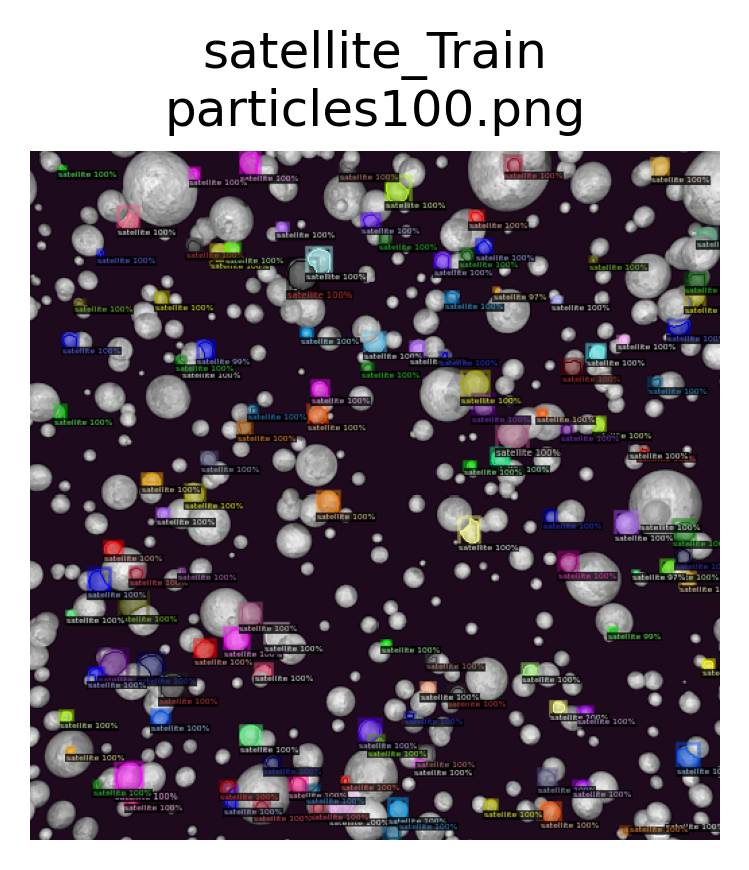

ddict info:
	path: ../../../../../../../ocean/projects/dmr200021p/sprice/synthetic_training/trainings/../images/a-lognormal-loc0.1-shape0.5/renders/particles100.png
	num_instances: 128
	File: ../../../../../../../ocean/projects/dmr200021p/sprice/synthetic_training/trainings/../images/a-lognormal-loc0.1-shape0.5/renders/particles101.png


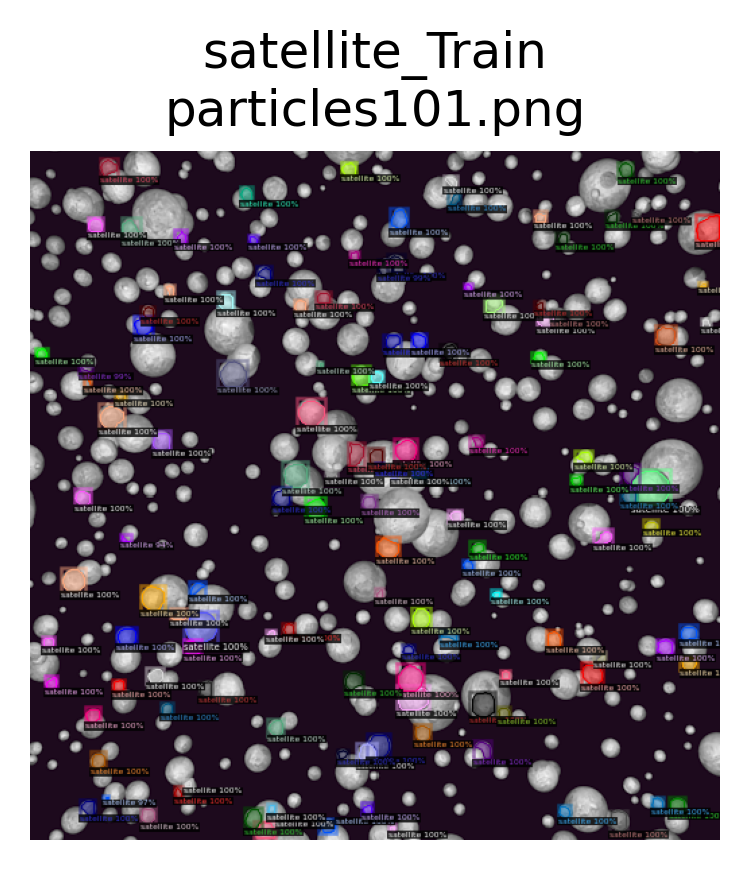

ddict info:
	path: ../../../../../../../ocean/projects/dmr200021p/sprice/synthetic_training/trainings/../images/a-lognormal-loc0.1-shape0.5/renders/particles101.png
	num_instances: 129
	File: ../../../../../../../ocean/projects/dmr200021p/sprice/synthetic_training/trainings/../images/a-lognormal-loc0.1-shape0.5/renders/particles102.png


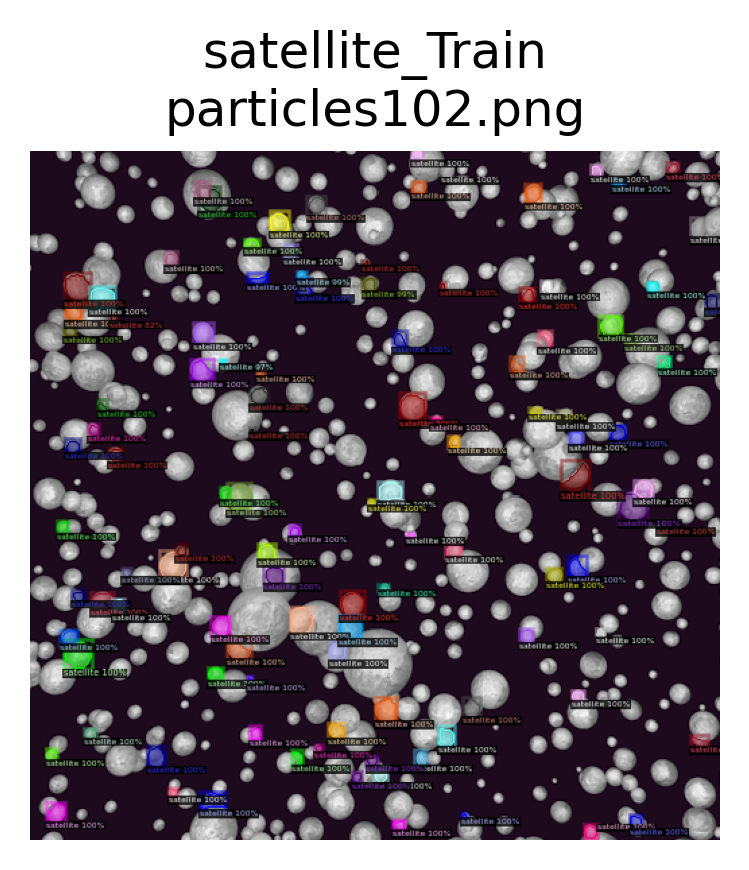

ddict info:
	path: ../../../../../../../ocean/projects/dmr200021p/sprice/synthetic_training/trainings/../images/a-lognormal-loc0.1-shape0.5/renders/particles102.png
	num_instances: 111
Dataset: satellite_Val
	File: ../../../../../../../ocean/projects/dmr200021p/sprice/synthetic_training/trainings/../images/a-lognormal-loc0.1-shape0.5/renders/particles11.png


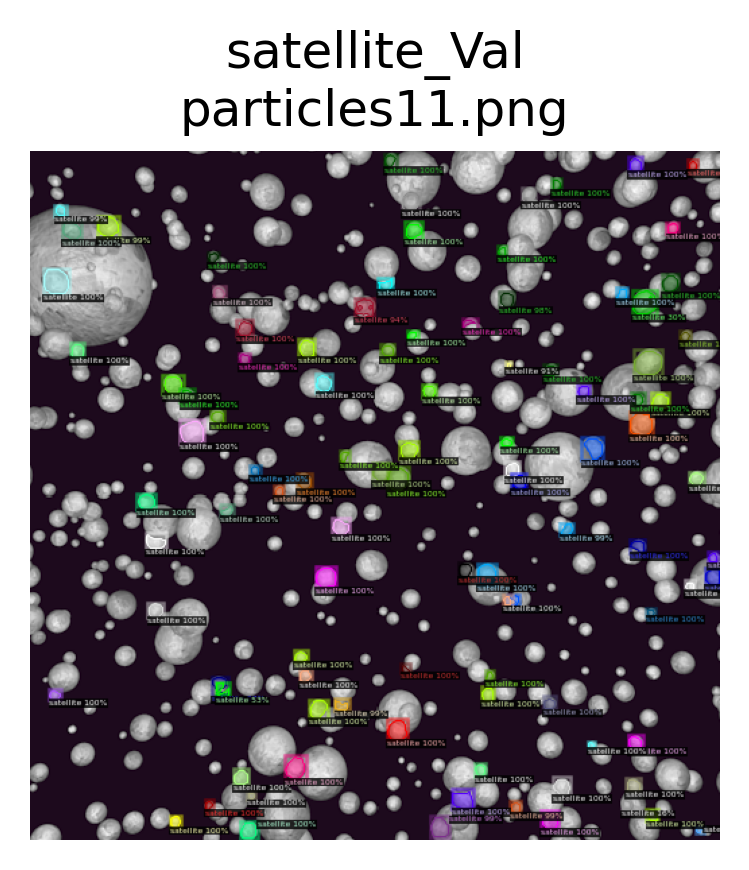

ddict info:
	path: ../../../../../../../ocean/projects/dmr200021p/sprice/synthetic_training/trainings/../images/a-lognormal-loc0.1-shape0.5/renders/particles11.png
	num_instances: 100
	File: ../../../../../../../ocean/projects/dmr200021p/sprice/synthetic_training/trainings/../images/a-lognormal-loc0.1-shape0.5/renders/particles10.png


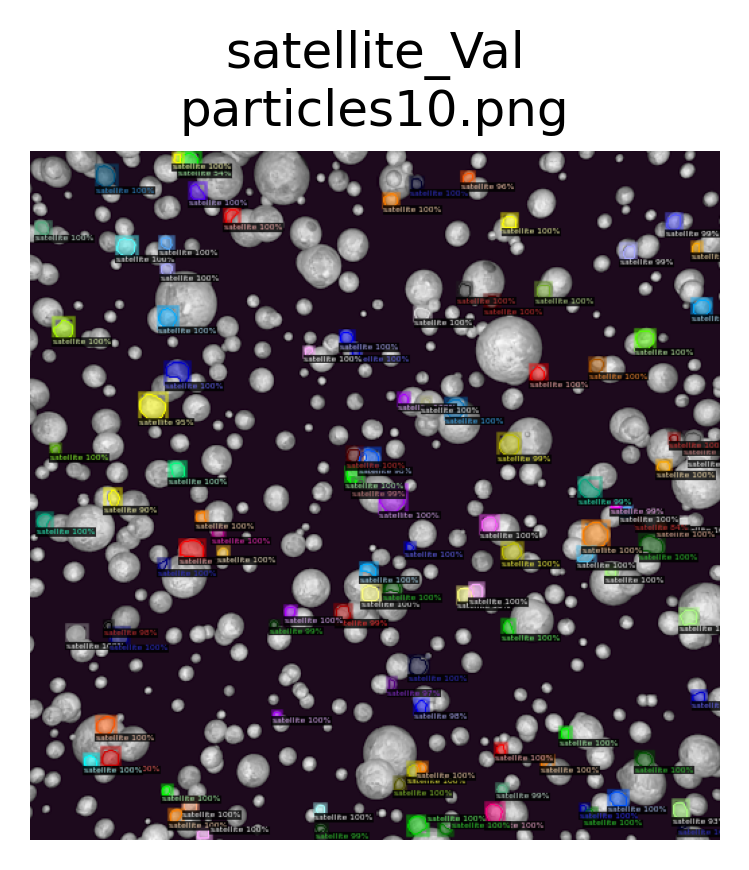

ddict info:
	path: ../../../../../../../ocean/projects/dmr200021p/sprice/synthetic_training/trainings/../images/a-lognormal-loc0.1-shape0.5/renders/particles10.png
	num_instances: 109
	File: ../../../../../../../ocean/projects/dmr200021p/sprice/synthetic_training/trainings/../images/a-lognormal-loc0.1-shape0.5/renders/particles1.png


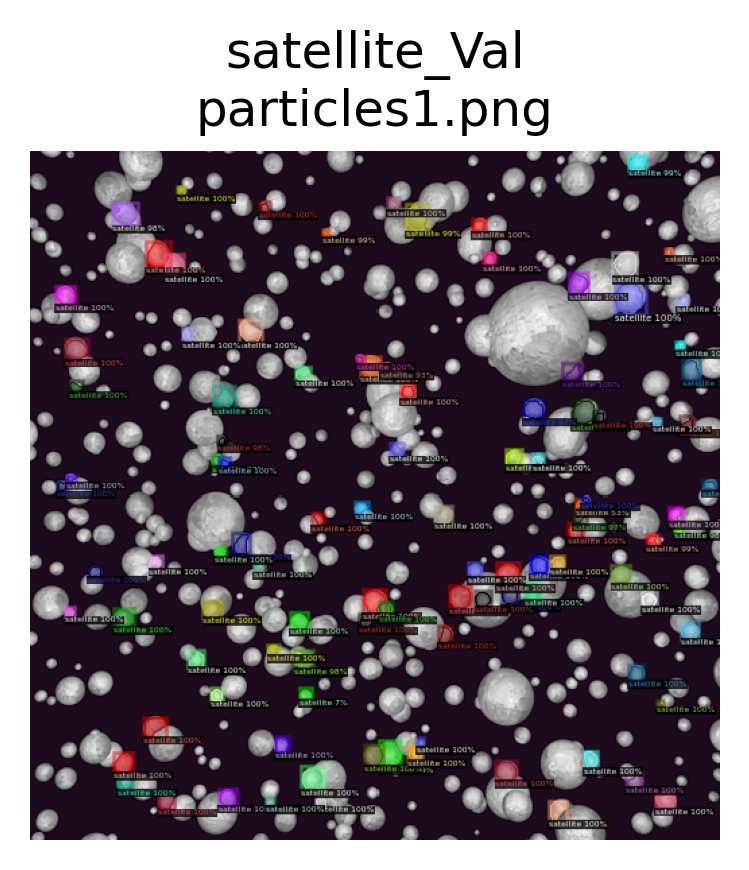

ddict info:
	path: ../../../../../../../ocean/projects/dmr200021p/sprice/synthetic_training/trainings/../images/a-lognormal-loc0.1-shape0.5/renders/particles1.png
	num_instances: 103


In [10]:
results = []
for ds in cfg.DATASETS.TEST:
    print(f'Dataset: {ds}')
    for dd in DatasetCatalog.get(ds):
        print(f'\tFile: {dd["file_name"]}')
        img = cv2.imread(dd['file_name'])  # load image
        outs = predictor(img)  # run inference on image
        
        # format results for visualization and store for later
        results.append(data_utils.format_outputs(dd['file_name'], ds, outs))

        # visualize results
        visualize.display_ddicts(outs, None, ds, gt=False, img_path=dd['file_name'])

# save to disk
#with open(Path('Stage_results',f'{EXPERIMENT_NAME}-base_stage.pickle'), 'wb') as f:
#    pickle.dump(results, f)

## Generating predictions on new images is simple.
We will load a new image (not included in either dataset) and generate predictions.
Note that we do not have labels for this image and do not need to register it to a dataset.

In [9]:
img_path = Path('..', 'Auto_annotate_images','S01_02_SE1_300X06.png')
img = cv2.imread(str(img_path))
outs = predictor(img)
data_utils.format_outputs(img_path, dataset='test', pred=outs)
visualize.display_ddicts(ddict=outs,  # predictions to display
                                 outpath=None, dataset='Test',  # don't save figure
                                 gt=False,  # specifies format as model predictions
                                img_path=img_path)  # path to image


AttributeError: 'NoneType' object has no attribute 'shape'

In [13]:
path = ocean_syn + 'images/a-lognormal-loc0.1-shape0.5/renders'
files = os.listdir(path)
img_names = []
for f in files:
    if f.split('.')[0] != 'particles103' and f.split('.')[0] != 'particles129' and f.split('.')[0] != 'particles159' and f.split('.')[0] != 'particles180':
        img_names.append(f.split('.')[0])
'''for f in img_names:
    print("Annotating: " + f)
    img_path = Path('..', 'data','images_png', f +'.png')
    img = cv2.imread(str(img_path))
    outs = predictor(img)
    export1 = export_anno.make_VIA_file(f +'.png', img_path, outs)
    export_anno.save_to_json(str(ampis_root) + f'/pred_annos/{EXPERIMENT_NAME}/' + f +'_anno.json', export1)
    outs = predictor(img)
    data_utils.format_outputs(img_path, dataset='test', pred=outs)
    visualize.display_ddicts(ddict=outs,  # predictions to display
                                 outpath=None, dataset='Test',  # don't save fi$
                                 gt=False,  # specifies format as model predict$
                                 img_path=img_path, # path to image
                                 suppress_labels=True, #hides class images
                                summary=False)  #hides the end print statement'''    
img_names.sort()
print(img_names)
for f in img_names:
    if len(f) > 9:
        print("Annotating: " + f)
        img_path = Path(path, f +'.png')
        img = cv2.imread(str(img_path))
        outs = predictor(img)
        #export1 = export_anno.make_VIA_file(f +'.png', img_path, outs)
        #export_anno.save_to_json(ocean_syn + 'pred_annos/a-lognormal-loc0.1-shape0.5/stage1.2/' + f +'_anno.json', export1)
        outs = predictor(img)
        data_utils.format_outputs(img_path, dataset='test', pred=outs)
        '''visualize.display_ddicts(ddict=outs,  # predictions to display
                                     outpath=None, dataset='Test',  # don't save fi$
                                     gt=False,  # specifies format as model predict$
                                     img_path=img_path, # path to image
                                     suppress_labels=True, #hides class images
                                     summary=True)  #hides the end print statement'''

['particles1', 'particles10', 'particles100', 'particles101', 'particles102', 'particles104', 'particles105', 'particles106', 'particles107', 'particles108', 'particles109', 'particles11', 'particles110', 'particles111', 'particles112', 'particles113', 'particles114', 'particles115', 'particles116', 'particles117', 'particles118', 'particles119', 'particles12', 'particles120', 'particles121', 'particles122', 'particles123', 'particles124', 'particles125', 'particles126', 'particles127', 'particles128', 'particles13', 'particles130', 'particles131', 'particles132', 'particles133', 'particles134', 'particles135', 'particles136', 'particles137', 'particles138', 'particles139', 'particles14', 'particles140', 'particles141', 'particles142', 'particles143', 'particles144', 'particles145', 'particles146', 'particles147', 'particles148', 'particles149', 'particles15', 'particles150', 'particles151', 'particles152', 'particles153', 'particles154', 'particles155', 'particles156', 'particles157',

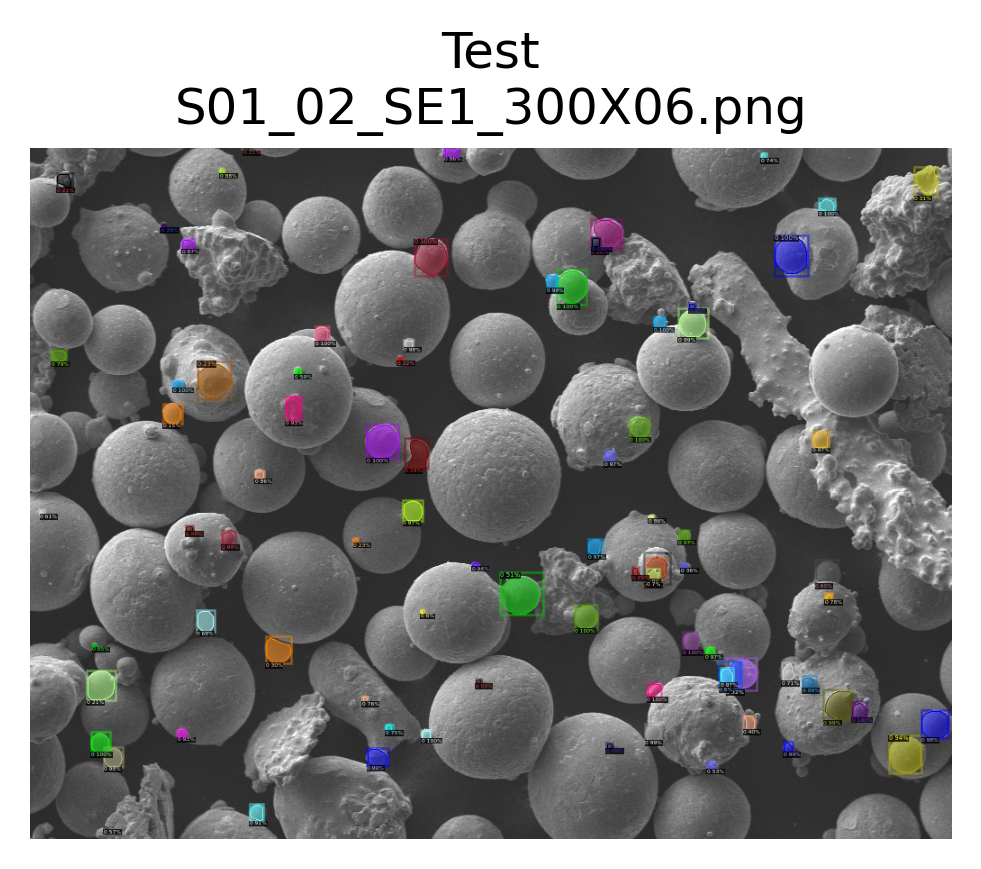

ddict info:
	path: ../Auto_annotate_images/S01_02_SE1_300X06.png
	num_instances: 84


In [11]:
img_path = Path('..', 'Auto_annotate_images','S01_02_SE1_300X06.png')
img = cv2.imread(str(img_path))
outs = predictor(img)
data_utils.format_outputs(img_path, dataset='test', pred=outs)
visualize.display_ddicts(ddict=outs,  # predictions to display
                                 outpath=None, dataset='Test',  # don't save figure
                                 gt=False,  # specifies format as model predictions
                                img_path=img_path)  # path to image


We will now generate predictions on all of the images in the training and validation sets, and save the results for later.

In [8]:
files = os.listdir('Auto_annotate_images')
img_names = []
for f in files:
    if f.split('.')[0] != '250x' and f.split('.')[0] != '500x':
        img_names.append(f.split('.')[0])
        
results = []
for f in img_names:
    print("Annotating: " + f)
    img_path = Path('Auto_annotate_images', f +'.png')
    img = cv2.imread(str(img_path))
    outs = predictor(img)
    data_utils.format_outputs(img_path, dataset='test', pred=outs)
    visualize.display_ddicts(ddict=outs,  # predictions to display
                                 outpath=None, dataset='Test',  # don't save fi$
                                 gt=False,  # specifies format as model predict$
                                 img_path=img_path, # path to image
                                 suppress_labels=True, #hides class images
                                 summary=True)  #hides the end print statement

# save to disk
with open(Path('Stage_results',f'{EXPERIMENT_NAME}-base_stage.pickle'), 'wb') as f:
    pickle.dump(results, f)

FileNotFoundError: [Errno 2] No such file or directory: 'Auto_annotate_images'